In [1]:
import numpy as np
import pandas as pd 

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical
from keras import regularizers

In [2]:
#fixed random seed for reproducibility 
np.random.seed(0)

In [3]:
# load dataset (input variables = X, output variables = Y)
df = pd.read_csv("2.csv")

#count the number of occurances for each osID
OsID_counts = df['OsID'].value_counts()

#filter for osIDs that have 10 or more occurances
OsID_counts_filtered = OsID_counts[OsID_counts >= 10]

#assign a label for each osID 
OsID_labels = {}
class_no = 0
for osID in OsID_counts_filtered.index:
    OsID_labels[osID] = class_no
    class_no +=1

#filter the dataset with osID that contain 10 or more occurances
dataGene = df[df['OsID'].isin(OsID_counts_filtered.index)]

dataGene = dataGene.drop(['Class', 'Trait'],axis=1)

# Add a new column 'class' to the filtered dataset
dataGene['class'] = dataGene['OsID'].map(OsID_labels)

#print("Summary of dataGene:\n",dataGene.describe())

In [4]:
X = dataGene.drop(['class','OsID'], axis=1) # exclude class & OsID column
Y = dataGene['class']

#input feature names in order of descending importance scores in PCC feature selection method
feature_names = ['Root10DaysSeedling', 'Leaf45DaysOldPlant', 'Shoot10DaysSeedling', 'Shoot35DaysSeedling', 'Root35DaysSeedling', 
                 'Leaf21DaysSeedling', 'Root14DaysSeedling', 'Shoot3DaysSeedling', 'Root24DaysSeedling', 'Root52DaysSeedling', 
                 'Root17DaysSeedling', 'Root21DaysSeedling', 'Shoot14DaysSeedling', 'Shoot21DaysSeedling', 'Shoot17DaysSeedling',
                  'ET', 'PCC', 'log_2FoldChange', 'PPI', 'CoExpression']

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X_fs.shape)
print("Shape of Y:\n",Y.shape)

# Statistical summary of the variables
#print("Summary of X:\n",X_fs.describe())
#print("Summary of Y:\n",Y.describe())

# Check for class imbalance
print(df.groupby(Y).size())

# change both input and target variables datatype to ndarray

X_fs = X_fs.values # 2-D array

# select target variable 

Y = Y.values #1-D array
Y = Y.reshape(-1, 1)


Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
class
0.0      1800
1.0      1296
2.0      1260
3.0      1218
4.0      1026
5.0      1008
6.0       930
7.0       912
8.0       880
9.0       798
10.0      792
11.0      759
12.0      729
13.0      720
14.0      702
15.0      693
16.0      672
17.0      640
18.0      625
19.0      570
20.0      546
21.0      506
22.0      483
23.0      448
24.0      432
25.0      384
26.0      360
27.0      360
28.0      320
29.0      312
         ... 
343.0      12
344.0      12
345.0      12
346.0      12
347.0      12
348.0      12
349.0      12
350.0      12
351.0      12
352.0      12
353.0      12
354.0      12
355.0      11
356.0      11
357.0      11
358.0      11
359.0      11
360.0      11
361.0      10
362.0      10
363.0      10
364.0      10
365.0      10
366.0      10
367.0      10
368.0      10
369.0      10
370.0      10
371.0      10
372.0      10
Length: 373, dtype: int64


Class=0, n=1800 (4.378%)
Class=1, n=1296 (3.153%)
Class=2, n=1260 (3.065%)
Class=3, n=1218 (2.963%)
Class=4, n=1026 (2.496%)
Class=5, n=1008 (2.452%)
Class=6, n=930 (2.262%)
Class=7, n=912 (2.218%)
Class=8, n=880 (2.141%)
Class=9, n=798 (1.941%)
Class=10, n=792 (1.927%)
Class=11, n=759 (1.846%)
Class=12, n=729 (1.773%)
Class=13, n=720 (1.751%)
Class=14, n=702 (1.708%)
Class=15, n=693 (1.686%)
Class=16, n=672 (1.635%)
Class=17, n=640 (1.557%)
Class=18, n=625 (1.520%)
Class=19, n=570 (1.387%)
Class=20, n=546 (1.328%)
Class=21, n=506 (1.231%)
Class=22, n=483 (1.175%)
Class=23, n=448 (1.090%)
Class=24, n=432 (1.051%)
Class=25, n=384 (0.934%)
Class=26, n=360 (0.876%)
Class=27, n=360 (0.876%)
Class=28, n=320 (0.778%)
Class=29, n=312 (0.759%)
Class=30, n=312 (0.759%)
Class=31, n=306 (0.744%)
Class=32, n=304 (0.739%)
Class=33, n=299 (0.727%)
Class=34, n=297 (0.722%)
Class=35, n=296 (0.720%)
Class=36, n=280 (0.681%)
Class=37, n=264 (0.642%)
Class=38, n=260 (0.632%)
Class=39, n=253 (0.615%)
Clas

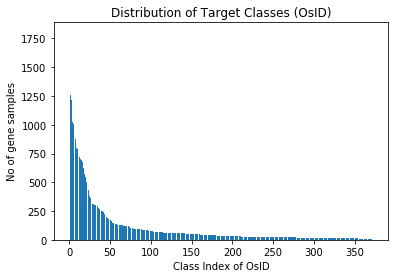

In [5]:
from collections import Counter
# summarize distribution
counter = Counter(Y.flatten())

# sort counter by keys
counter = dict(sorted(counter.items()))

for k,v in counter.items():
 per = v / len(Y.flatten()) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar( counter.keys(), counter.values())

plt.ylabel('No of gene samples')
plt.xlabel('Class Index of OsID')
plt.title('Distribution of Target Classes (OsID)')
plt.show()

In [6]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn') 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [7]:
# prepare target data
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	
	#fit the encoders only to the training data and then transform both train and test data
	y_train_enc = le.fit_transform(y_train)
	y_test_enc = le.transform(y_test)

	return y_train_enc, y_test_enc

In [8]:
# define baseline model (MLP)
def MLP_model(input_dim):

    model = Sequential()
    model.add(Dense(60, input_dim=input_dim,bias_initializer='normal', activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(373,kernel_initializer='normal', activation='softmax')) #softmax for multi-class classification, num_classes = 373

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [9]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_fs, Y, test_size=0.33, random_state=1)

# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

# Define the number of folds for k-fold cross-validation
k = 2

# Define the cross-validation method
cv_method = StratifiedKFold(n_splits=k)

# Initialize the list to store the history, train & validation(accuracy & loss) for each model
models = []
model_history = []
model_accuracy = []
model_train_acc = []
model_train_loss = []
model_val_acc = []
model_val_loss = []


for i in range(1,21):

    models_fold = []
    hist = []
    train_accuracy = []
    train_loss = []
    val_accuracy = []
    val_loss = []
    test_accuracy = []

    print("Number of input features:",i)

    # Select the input features from the input data
    X_train_selected = X_train[:, :i]
    X_test_selected = X_test[:, :i]

    # Loop over the folds
    for fold, (train_index, val_index) in enumerate(cv_method.split(X_train_selected, y_train)):

        print("Fold:", fold+1)

        # Split the data into train and validation sets using the current fold index
        X_train_fold  = X_train_selected[train_index]
        y_train_fold  = y_train[train_index]
        X_val_fold = X_train_selected[val_index]
        y_val_fold = y_train[val_index]

        # Prepare the target data
        y_train_fold_enc, y_val_fold_enc = prepare_targets(y_train_fold, y_val_fold)

        # build the model
        model = MLP_model(i)

        # Fit the model to the training data for the current fold
        history = model.fit(X_train_fold, to_categorical(y_train_fold_enc, num_classes=373), epochs=80, batch_size=5, verbose=1, validation_split = 0.33)
    
        # Evaluate the model on the validation data for the current fold
        val_scores = model.evaluate(X_val_fold, to_categorical(y_val_fold_enc, num_classes=373), verbose=0)
        val_accuracy.append(val_scores[1])
        val_loss.append(val_scores[0])

        # Evaluate the model on the test data for the current fold
        test_scores = model.evaluate(X_test_selected, to_categorical(y_test_enc, num_classes=373), verbose=0)
        test_accuracy.append(test_scores[1])

        # add the model to the list of models
        models_fold.append(model)
        hist.append(history)

        # store the training accuracy and loss for each fold
        train_accuracy.append(history.history['accuracy'])
        train_loss.append(history.history['loss'])
        
    # Calculate the average test and validation accuracy and loss across all folds
    avg_test_acc = sum(test_accuracy) / len(test_accuracy)
    avg_val_acc = sum(val_accuracy) / len(val_accuracy)
    avg_val_loss = sum(val_loss) / len(val_loss)

    # Print the average validation and test accuracy and loss
    print("Average Validation Accuracy:", avg_val_acc)
    print("Average Validation Loss:",avg_val_loss)
    print("Average Test Accuracy:", avg_test_acc)

    best_fold_index = test_accuracy.index(max(test_accuracy))
    model_accuracy.append(test_accuracy[best_fold_index])
    models.append(models_fold[best_fold_index])
    model_history.append(hist[best_fold_index])
    model_train_acc.append(train_accuracy[best_fold_index])
    model_train_loss.append(train_loss[best_fold_index])
    model_val_acc.append(val_accuracy[best_fold_index])
    model_val_loss.append(val_loss[best_fold_index])


    print("Final Test Accuracy for each fold:", test_accuracy[best_fold_index])

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated i

Number of input features: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dty

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 6s 2ms/step - loss: 4.3481 - accuracy: 0.1155 - val_loss: 3.9604 - val_accuracy: 0.1351
Epoch 2/80
1834/1834 [==============================] - 4s 2ms/step - loss: 3.5627 - accuracy: 0.2109 - val_loss: 3.5477 - val_accuracy: 0.2254
Epoch 3/80
1834/1834 [==============================] - 4s 2ms/step - loss: 3.2022 - accuracy: 0.2689 - val_loss: 3.2669 - val_accuracy: 0.2808
Epoch 4/80
1834/1834 [==============================] - 4s 2ms/step - loss: 2.9283 - accuracy: 0.3182 - val_loss: 3.0524 - val_accuracy: 0.3291
Epoch 5/80
1834/1834 [==============================] - 4s 2ms/step - loss: 2.7185 - accuracy: 0.3580 - val_loss: 2.8586 - val_accuracy: 0.3082
Epoch 6/80
1834/1834 [==============================] - 4s 2ms/step - loss: 2.5644 - accuracy: 0.3781 - val_loss: 2.7292 - val_accuracy: 0.3698
Epoch 7/80
1834/1834 [==============================] - 3s 2ms/step - loss: 2.4430 - accuracy: 0.4054 - val_loss: 2.6288 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/80
1834/1834 [==============================] - 12s 4ms/step - loss: 4.0248 - accuracy: 0.2006 - val_loss: 3.3414 - val_accuracy: 0.3483
Epoch 2/80
1834/1834 [==============================] - 6s 3ms/step - loss: 2.7696 - accuracy: 0.3910 - val_loss: 2.6420 - val_accuracy: 0.4750
Epoch 3/80
1834/1834 [==============================] - 6s 3ms/step - loss: 2.1589 - accuracy: 0.5086 - val_loss: 2.2201 - val_accuracy: 0.5361
Epoch 4/80
1834/1834 [==============================] - 6s 4ms/step - loss: 1.7663 - accuracy: 0.5782 - val_loss: 1.9399 - val_accuracy: 0.6278
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.5293 - accuracy: 0.6249 - val_loss: 1.7554 - val_accuracy: 0.6096
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3727 - accuracy: 0.6521 - val_loss: 1.6110 - val_accuracy: 0.6353
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.2682 - accuracy: 0.6683 - val_loss: 1.5014 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 15s 5ms/step - loss: 4.0282 - accuracy: 0.2193 - val_loss: 3.2526 - val_accuracy: 0.3609
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 2.4935 - accuracy: 0.5091 - val_loss: 2.2664 - val_accuracy: 0.5866
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.6788 - accuracy: 0.6483 - val_loss: 1.6853 - val_accuracy: 0.6878
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.2266 - accuracy: 0.7242 - val_loss: 1.3740 - val_accuracy: 0.7360
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9703 - accuracy: 0.7642 - val_loss: 1.2547 - val_accuracy: 0.7752
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8316 - accuracy: 0.7895 - val_loss: 1.0841 - val_accuracy: 0.7950
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7438 - accuracy: 0.8050 - val_loss: 1.0153 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/80
1834/1834 [==============================] - 13s 4ms/step - loss: 3.5910 - accuracy: 0.3368 - val_loss: 2.5629 - val_accuracy: 0.5673
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.7859 - accuracy: 0.6745 - val_loss: 1.6491 - val_accuracy: 0.7155
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1242 - accuracy: 0.7726 - val_loss: 1.1764 - val_accuracy: 0.7941
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8036 - accuracy: 0.8227 - val_loss: 0.9619 - val_accuracy: 0.8178
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6417 - accuracy: 0.8482 - val_loss: 0.8800 - val_accuracy: 0.8136
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5624 - accuracy: 0.8609 - val_loss: 0.7486 - val_accuracy: 0.8565
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5087 - accuracy: 0.8693 - val_loss: 0.7167 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 4ms/step - loss: 3.3421 - accuracy: 0.3858 - val_loss: 2.1954 - val_accuracy: 0.6039
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4211 - accuracy: 0.7394 - val_loss: 1.2863 - val_accuracy: 0.7839
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8493 - accuracy: 0.8182 - val_loss: 0.9314 - val_accuracy: 0.8229
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6124 - accuracy: 0.8560 - val_loss: 0.7918 - val_accuracy: 0.8406
Epoch 5/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4906 - accuracy: 0.8779 - val_loss: 0.6611 - val_accuracy: 0.8649
Epoch 6/80
1834/1834 [==============================] - 6s 4ms/step - loss: 0.4148 - accuracy: 0.8943 - val_loss: 0.5721 - val_accuracy: 0.8961
Epoch 7/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3691 - accuracy: 0.9065 - val_loss: 0.5315 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/80
1834/1834 [==============================] - 15s 4ms/step - loss: 3.4901 - accuracy: 0.3582 - val_loss: 2.3692 - val_accuracy: 0.5903
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.5174 - accuracy: 0.7187 - val_loss: 1.3766 - val_accuracy: 0.7431
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8855 - accuracy: 0.8102 - val_loss: 0.9381 - val_accuracy: 0.8317
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6009 - accuracy: 0.8617 - val_loss: 0.7793 - val_accuracy: 0.8443
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4653 - accuracy: 0.8889 - val_loss: 0.6713 - val_accuracy: 0.8758
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3923 - accuracy: 0.9033 - val_loss: 0.5917 - val_accuracy: 0.9026
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3379 - accuracy: 0.9171 - val_loss: 0.5693 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 13s 4ms/step - loss: 3.7988 - accuracy: 0.2955 - val_loss: 2.7036 - val_accuracy: 0.5390
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.8425 - accuracy: 0.6661 - val_loss: 1.6417 - val_accuracy: 0.7250
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.0852 - accuracy: 0.7976 - val_loss: 1.1860 - val_accuracy: 0.8202
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7426 - accuracy: 0.8480 - val_loss: 0.9399 - val_accuracy: 0.8521
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5587 - accuracy: 0.8752 - val_loss: 0.7871 - val_accuracy: 0.8738
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4452 - accuracy: 0.8959 - val_loss: 0.6926 - val_accuracy: 0.8853
Epoch 7/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3812 - accuracy: 0.9084 - val_loss: 0.6170 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/80
1834/1834 [==============================] - 12s 4ms/step - loss: 3.6757 - accuracy: 0.3224 - val_loss: 2.5351 - val_accuracy: 0.5985
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.6802 - accuracy: 0.6907 - val_loss: 1.5123 - val_accuracy: 0.7310
Epoch 3/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.9720 - accuracy: 0.8046 - val_loss: 1.0339 - val_accuracy: 0.8202
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6456 - accuracy: 0.8566 - val_loss: 0.8392 - val_accuracy: 0.8682
Epoch 5/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4868 - accuracy: 0.8872 - val_loss: 0.7793 - val_accuracy: 0.8419
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4038 - accuracy: 0.9007 - val_loss: 0.6824 - val_accuracy: 0.9059
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3410 - accuracy: 0.9138 - val_loss: 0.6099 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.5691 - accuracy: 0.3389 - val_loss: 2.4083 - val_accuracy: 0.5839
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 1.5714 - accuracy: 0.7086 - val_loss: 1.3863 - val_accuracy: 0.7653
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8929 - accuracy: 0.8200 - val_loss: 0.9943 - val_accuracy: 0.8390
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5978 - accuracy: 0.8686 - val_loss: 0.8118 - val_accuracy: 0.8720
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4525 - accuracy: 0.8966 - val_loss: 0.7041 - val_accuracy: 0.8884
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3660 - accuracy: 0.9168 - val_loss: 0.6105 - val_accuracy: 0.9128
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3119 - accuracy: 0.9249 - val_loss: 0.5924 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 12s 4ms/step - loss: 3.6449 - accuracy: 0.3269 - val_loss: 2.3892 - val_accuracy: 0.5609
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 1.5709 - accuracy: 0.7042 - val_loss: 1.3886 - val_accuracy: 0.7768
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9031 - accuracy: 0.8180 - val_loss: 1.0060 - val_accuracy: 0.8299
Epoch 4/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6293 - accuracy: 0.8614 - val_loss: 0.7853 - val_accuracy: 0.8629
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4865 - accuracy: 0.8909 - val_loss: 0.6645 - val_accuracy: 0.8997
Epoch 6/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4062 - accuracy: 0.9035 - val_loss: 0.5946 - val_accuracy: 0.8789
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3464 - accuracy: 0.9164 - val_loss: 0.5239 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 12s 4ms/step - loss: 3.5379 - accuracy: 0.3498 - val_loss: 2.3368 - val_accuracy: 0.6076
Epoch 2/80
1834/1834 [==============================] - 8s 5ms/step - loss: 1.4649 - accuracy: 0.7465 - val_loss: 1.2986 - val_accuracy: 0.7876
Epoch 3/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7894 - accuracy: 0.8416 - val_loss: 0.8648 - val_accuracy: 0.8618
Epoch 4/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.5083 - accuracy: 0.8852 - val_loss: 0.6828 - val_accuracy: 0.8849
Epoch 5/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3825 - accuracy: 0.9056 - val_loss: 0.5695 - val_accuracy: 0.9001
Epoch 6/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3054 - accuracy: 0.9261 - val_loss: 0.6054 - val_accuracy: 0.8767
Epoch 7/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2706 - accuracy: 0.9357 - val_loss: 0.4708 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/80
1834/1834 [==============================] - 13s 5ms/step - loss: 3.3748 - accuracy: 0.3904 - val_loss: 2.1351 - val_accuracy: 0.6439
Epoch 2/80
1834/1834 [==============================] - 8s 5ms/step - loss: 1.3155 - accuracy: 0.7527 - val_loss: 1.1996 - val_accuracy: 0.7764
Epoch 3/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.7334 - accuracy: 0.8456 - val_loss: 0.8540 - val_accuracy: 0.8401
Epoch 4/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5153 - accuracy: 0.8832 - val_loss: 0.8093 - val_accuracy: 0.8463
Epoch 5/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3934 - accuracy: 0.9064 - val_loss: 0.6741 - val_accuracy: 0.8742
Epoch 6/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3218 - accuracy: 0.9242 - val_loss: 0.6052 - val_accuracy: 0.8698
Epoch 7/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2829 - accuracy: 0.9301 - val_loss: 0.5000 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 13s 5ms/step - loss: 3.5102 - accuracy: 0.3647 - val_loss: 2.2725 - val_accuracy: 0.5877
Epoch 2/80
1834/1834 [==============================] - 8s 5ms/step - loss: 1.4288 - accuracy: 0.7383 - val_loss: 1.2285 - val_accuracy: 0.7845
Epoch 3/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7549 - accuracy: 0.8473 - val_loss: 0.8876 - val_accuracy: 0.8561
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4997 - accuracy: 0.8941 - val_loss: 0.6643 - val_accuracy: 0.8882
Epoch 5/80
1834/1834 [==============================] - 10s 5ms/step - loss: 0.3798 - accuracy: 0.9144 - val_loss: 0.6082 - val_accuracy: 0.8877
Epoch 6/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3132 - accuracy: 0.9290 - val_loss: 0.5119 - val_accuracy: 0.9150
Epoch 7/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2739 - accuracy: 0.9357 - val_loss: 0.4790 - val

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 15s 5ms/step - loss: 3.3489 - accuracy: 0.3923 - val_loss: 2.1217 - val_accuracy: 0.6227
Epoch 2/80
1834/1834 [==============================] - 9s 5ms/step - loss: 1.3411 - accuracy: 0.7438 - val_loss: 1.1789 - val_accuracy: 0.7814
Epoch 3/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7570 - accuracy: 0.8392 - val_loss: 0.9069 - val_accuracy: 0.8337
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5301 - accuracy: 0.8809 - val_loss: 0.7200 - val_accuracy: 0.8895
Epoch 5/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4065 - accuracy: 0.9029 - val_loss: 0.6007 - val_accuracy: 0.8981
Epoch 6/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3464 - accuracy: 0.9175 - val_loss: 0.5614 - val_accuracy: 0.9043
Epoch 7/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3023 - accuracy: 0.9265 - val_loss: 0.4983 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 9s 3ms/step - loss: 3.3993 - accuracy: 0.3746 - val_loss: 2.1548 - val_accuracy: 0.6194
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3170 - accuracy: 0.7495 - val_loss: 1.1322 - val_accuracy: 0.8018
Epoch 3/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7238 - accuracy: 0.8446 - val_loss: 0.8167 - val_accuracy: 0.8465
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4971 - accuracy: 0.8812 - val_loss: 0.6708 - val_accuracy: 0.8727
Epoch 5/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3914 - accuracy: 0.9052 - val_loss: 0.5963 - val_accuracy: 0.8853
Epoch 6/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3360 - accuracy: 0.9131 - val_loss: 0.5255 - val_accuracy: 0.9015
Epoch 7/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2951 - accuracy: 0.9248 - val_loss: 0.4905 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 9s 3ms/step - loss: 3.4903 - accuracy: 0.3268 - val_loss: 2.3223 - val_accuracy: 0.5624
Epoch 2/80
1834/1834 [==============================] - 5s 3ms/step - loss: 1.5532 - accuracy: 0.7070 - val_loss: 1.4790 - val_accuracy: 0.7352
Epoch 3/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.9273 - accuracy: 0.8183 - val_loss: 1.0465 - val_accuracy: 0.8379
Epoch 4/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.6156 - accuracy: 0.8713 - val_loss: 0.8355 - val_accuracy: 0.8884
Epoch 5/80
1834/1834 [==============================] - 5s 3ms/step - loss: 0.4513 - accuracy: 0.9033 - val_loss: 0.7129 - val_accuracy: 0.9012
Epoch 6/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3507 - accuracy: 0.9221 - val_loss: 0.6620 - val_accuracy: 0.9057
Epoch 7/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.2935 - accuracy: 0.9303 - val_loss: 0.5595 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 10s 4ms/step - loss: 3.4273 - accuracy: 0.3387 - val_loss: 2.2310 - val_accuracy: 0.5808
Epoch 2/80
1834/1834 [==============================] - 6s 3ms/step - loss: 1.5061 - accuracy: 0.7167 - val_loss: 1.2690 - val_accuracy: 0.7850
Epoch 3/80
1834/1834 [==============================] - 5s 3ms/step - loss: 0.7832 - accuracy: 0.8368 - val_loss: 0.8319 - val_accuracy: 0.8707
Epoch 4/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4962 - accuracy: 0.8851 - val_loss: 0.6367 - val_accuracy: 0.8780
Epoch 5/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3661 - accuracy: 0.9095 - val_loss: 0.5136 - val_accuracy: 0.9141
Epoch 6/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3027 - accuracy: 0.9271 - val_loss: 0.4726 - val_accuracy: 0.9218
Epoch 7/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.2606 - accuracy: 0.9363 - val_loss: 0.4619 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/80
1834/1834 [==============================] - 10s 4ms/step - loss: 3.4049 - accuracy: 0.3445 - val_loss: 2.1615 - val_accuracy: 0.6136
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3599 - accuracy: 0.7515 - val_loss: 1.2628 - val_accuracy: 0.7733
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7730 - accuracy: 0.8484 - val_loss: 0.8808 - val_accuracy: 0.8477
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5109 - accuracy: 0.8929 - val_loss: 0.7233 - val_accuracy: 0.8846
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3790 - accuracy: 0.9161 - val_loss: 0.6229 - val_accuracy: 0.9163
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3060 - accuracy: 0.9335 - val_loss: 0.5544 - val_accuracy: 0.9159
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2550 - accuracy: 0.9388 - val_loss: 0.5099 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 11s 4ms/step - loss: 3.2811 - accuracy: 0.3931 - val_loss: 1.9820 - val_accuracy: 0.6490
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 1.2661 - accuracy: 0.7652 - val_loss: 1.1760 - val_accuracy: 0.7998
Epoch 3/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.7044 - accuracy: 0.8608 - val_loss: 0.7625 - val_accuracy: 0.8747
Epoch 4/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4470 - accuracy: 0.9035 - val_loss: 0.6819 - val_accuracy: 0.8716
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3268 - accuracy: 0.9245 - val_loss: 0.5184 - val_accuracy: 0.9181
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2552 - accuracy: 0.9419 - val_loss: 0.4505 - val_accuracy: 0.9314
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2193 - accuracy: 0.9469 - val_loss: 0.4447 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/80
1834/1834 [==============================] - 11s 4ms/step - loss: 3.2474 - accuracy: 0.3861 - val_loss: 1.8967 - val_accuracy: 0.6687
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1803 - accuracy: 0.7727 - val_loss: 1.0636 - val_accuracy: 0.8140
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6497 - accuracy: 0.8617 - val_loss: 0.7216 - val_accuracy: 0.8709
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4302 - accuracy: 0.8970 - val_loss: 0.6078 - val_accuracy: 0.8855
Epoch 5/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3235 - accuracy: 0.9193 - val_loss: 0.5171 - val_accuracy: 0.9090
Epoch 6/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.2590 - accuracy: 0.9354 - val_loss: 0.4512 - val_accuracy: 0.9212
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2277 - accuracy: 0.9412 - val_loss: 0.4350 - val_accuracy

In [10]:
#to show the no of input features and its corresponding model accuracy
model_list = []

#Iterate through each model's accuracy 
for i in range (len(model_accuracy)):
    #get the number of input features for the current model
    no_features = i + 1

    #round the model accuries to 3 d.p.
    rounded_model_acc = round(model_accuracy[i], 3)
    
    model_list.append([no_features, rounded_model_acc])

models_df = pd.DataFrame(model_list, columns=["No of input features", "Model accuracy"])

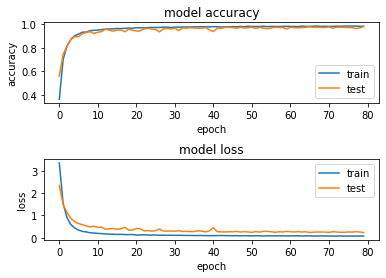

Final Test Accuracy: 0.9861428737640381


In [11]:
# Select the final model based on the max test accuracy across all models

best_model_index = model_accuracy.index(max(model_accuracy))

best_model = models[best_model_index]
best_model_history = model_history[best_model_index]
best_model_train_acc = model_train_acc[best_model_index]
best_model_train_loss = model_train_loss[best_model_index]
best_model_val_acc = model_val_acc[best_model_index]
best_model_val_loss = model_val_loss[best_model_index]

# summarize history for accuracy  
plt.subplot(211)  
plt.plot(best_model_history.history['accuracy'])  
plt.plot(best_model_history.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='lower right')  

# summarize history for loss
plt.subplot(212)  
plt.plot(best_model_history.history['loss'])  
plt.plot(best_model_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper right')  
plt.subplots_adjust(hspace=0.7)

plt.show() 

print("Final Test Accuracy:", model_accuracy[best_model_index])

In [12]:
#Select only the optimal number of input features for X_test
X_test = X_test[:,:(best_model_index+1)]

# Evaluate the best model on the test data
y_pred = best_model.predict(X_test)

# np.argmax() is used to convert the one-hot encoded predictions and test labels to class labels.
y_pred_label = np.argmax(y_pred, axis = 1)

# Print the classification report
print("Classification report:\n", classification_report(y_test_enc, y_pred_label))


424/424 [==============================] - 2s 2ms/step
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       591
           1       1.00      1.00      1.00       430
           2       1.00      1.00      1.00       419
           3       1.00      1.00      1.00       384
           4       1.00      1.00      1.00       339
           5       1.00      1.00      1.00       342
           6       1.00      1.00      1.00       310
           7       1.00      1.00      1.00       325
           8       1.00      1.00      1.00       294
           9       1.00      1.00      1.00       269
          10       1.00      1.00      1.00       296
          11       1.00      1.00      1.00       258
          12       1.00      1.00      1.00       247
          13       1.00      1.00      1.00       237
          14       1.00      1.00      1.00       239
          15       1.00      1.00      1.00       235
  

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [13]:
# extract class labels from test data
class_test = y_test_enc

# Invert OsID_labels dictionary
inv_OsID_labels = {v: k for k, v in OsID_labels.items()}

# map OsID values to the class labels
OsID_test = [inv_OsID_labels.get(value, 'Unknown') for value in class_test]

# create dataframe with OsID, true class, predicted class, and true/false columns
results = pd.DataFrame({
    'OsID': OsID_test,
    'True Class': y_test_enc,
    'Predicted Class': y_pred_label,
    'True/False': class_test == y_pred_label
})

# display dataframe
print(results.head())

# save results_df to a CSV file
results.to_csv('MLP_gene classification.csv', index=False)

           OsID  True Class  Predicted Class  True/False
0  Os11g0704500         328              237       False
1  Os09g0279600         161              161        True
2  Os03g0669100          17               17        True
3  Os05g0542500          34               34        True
4  Os09g0522000           7                7        True
